In [1]:
import network
import networkx as nx
import pandas as pd
import geopandas as gpd
import numpy as np
from datetime import datetime
import importlib
importlib.reload(network)
import matplotlib.pyplot as plt
import types
from IPython.display import clear_output
import os
import seaborn as sns
import osmnx as ox

In [7]:
ville_shp = gpd.read_file('Data ville/reseau_cyclable_2025_12_02/reseau_cyclable_2025_12_02_LMiara.gdb')

In [10]:
ville_shp.columns

Index(['avancement', 'id_cycl', 'id_trc', 'longueur', 'nbr_voie',
       'nom_arr_ville', 'projet_nom', 'protege_4s', 'revetement', 'rev_axes',
       'rev_axe_num', 'saisons4', 'separateur', 'structure', 'type_voie',
       'type_voie2', 'ville_mtl', 'lien', 'gestion', 'Shape_Length',
       'geometry'],
      dtype='object')

In [21]:
buildable = ville_shp[ville_shp.avancement.isin(['P','GP','N','PS','R'])]

In [22]:
ville_projete.explore(column = 'type_voie2',categorical = True)

In [85]:
n = network.Network()
ex = 'Data/Reseaux/ns_EX_PVR.graphml'
pot = 'Data/Reseaux/ns_POT_PVR.graphml'
trips_od18 = 'Data/od18_extraqit_20250123/od18_extraqit_20250123.csv'
stm_gtfs = 'Data/gtfs_stm/stops.txt'
signals_file = 'Data/feux-circulation.csv'
n.load_n_pot(pot)
n.load_n_ex(ex)
n.load_trips(trips_od18,source_crs=2950)
stops = pd.read_csv(stm_gtfs)
metros = stops[stops['location_type']==1]
metros = gpd.GeoDataFrame(metros,geometry = gpd.points_from_xy(metros.stop_lon,metros.stop_lat),crs = 4326).to_crs(n.crs)
n.transit_stops=metros
signals = pd.read_csv(signals_file)
def add_traffic_signals(signals,network):
    signals = gpd.GeoDataFrame(signals,geometry = gpd.points_from_xy(signals.Longitude,signals.Latitude),crs = 4326).to_crs(n.crs)
    network.traffic_signals=signals
    near_traffic_signals = gpd.sjoin_nearest(n.n_pot_nodes,n.traffic_signals,max_distance=15,how = 'left')
    near_traffic_signals = near_traffic_signals[~near_traffic_signals.index.duplicated(keep='first')]
    network.n_pot_nodes['traffic_signals'] = near_traffic_signals.index_right.notna()


In [86]:
def funcToMethod(func, obj, method_name=None):
    name = method_name or func.__name__
    bound = types.MethodType(func, obj)
    setattr(obj, name, bound)
    
def is_almost_subset(a, b, tolerance=0.1):
    if not a:
        return True
    common = a & b
    match_fraction = len(common) / len(a)
    return match_fraction >= (1 - tolerance)

def get_mask(x, all_routes, tolerance):
    return [
        (route != x) and (len(route) != 0) and is_almost_subset(route, x, tolerance=tolerance)
        for route in all_routes
    ]

def split_components(gdf,cycleway_nodes):

    gdf = gdf.copy()
    df = gdf.reset_index()  # in case index is (u,v,key)

    prev_u = df['u'].shift()
    prev_v = df['v'].shift()
    
    connected_to_prev = (
        (df['u'] == prev_u) |
        (df['u'] == prev_v) |
        (df['v'] == prev_u) |
        (df['v'] == prev_v)
    )

    df['component'] = (~connected_to_prev).cumsum() - 1
    gdf['component']=df['component'].values
    
    g = gdf.reset_index().groupby('component')
    component_lengths = g['length'].sum()
    gdf['component_length'] = gdf['component'].map(component_lengths)
    first_u = g['u'].first()
    last_v  = g['v'].last()
    start_conn = first_u.isin(cycleway_nodes)
    end_conn   = last_v.isin(cycleway_nodes)
    gdf['start_connected'] = gdf['component'].map(start_conn)
    gdf['end_connected']   = gdf['component'].map(end_conn)
    gdf['both_connected'] = gdf['start_connected'] & gdf['end_connected']

    return gdf

def group_street_components(gdf, name_col="street_name"):
    # Result container
    all_results = []

    # Process each street name separately
    for name, group in gdf.groupby(name_col):
        group = group.copy()
        group = group.reset_index(drop=False)  # keep original index

        # Build graph
        G = nx.Graph()
        G.add_nodes_from(group.index)

        # Spatial index speeds up the touching lookup
        sindex = group.sindex

        for i, geom in group.geometry.items():
            # Candidate neighbors using bounding box intersection
            possible = list(sindex.intersection(geom.bounds))
            possible.remove(i)  # remove itself

            for j in possible:
                if geom.touches(group.geometry[j]) or geom.intersects(group.geometry[j]):
                    G.add_edge(i, j)

        # Extract connected components
        components = list(nx.connected_components(G))

        # Assign component labels
        comp_map = {}
        for comp_id, comp_nodes in enumerate(components):
            for n in comp_nodes:
                comp_map[n] = comp_id

        group["component_id"] = group.index.map(comp_map)
        group["project"] = (
            group[name_col].astype(str) + "_" + group["component_id"].astype(str)
        )

        all_results.append(group)

    return gpd.GeoDataFrame(pd.concat(all_results).set_index(['u','v','key']))

def compute_routes_summary(self, beta_age,mu_age,scale_age,beta_transit,beta_bikeway,alpha,weight = None, proximity_dist = 10, subsample_idxs = None):
    
    if subsample_idxs is None:
        subsample = self.all_routes_edges
        subsample_idxs = self.sample.index
        self.routes_summary = subsample[['length','gencost','route_number']].groupby(['route_number']).sum()
        self.routes_summary = pd.merge(self.routes_summary,self.sample,left_index=True,right_index=True,how='left')
        if self.projects is not None:
            self.projects_summary = self.projects[['length','project']].groupby('project').sum()
    else:
        subsample = self.all_routes_edges[self.all_routes_edges.route_number.isin(subsample_idxs)]

    subsample['flow'] = subsample.join(subsample.index.value_counts(), how = 'left')['count']
    grouped_route_links = subsample.groupby('route_number')

    
    
    self.routes_summary.loc[subsample_idxs,'length_cycleway'] = grouped_route_links.apply(
        lambda x: x.loc[x["highway"] == "cycleway", "length"].sum(),include_groups=False)
    self.routes_summary.loc[subsample_idxs,'length_street'] =grouped_route_links.apply(
        lambda x: x.loc[x["highway"] != "cycleway", "length"].sum(),include_groups=False)
    self.routes_summary.loc[subsample_idxs,'total_length'] = self.routes_summary.loc[subsample_idxs,'length_cycleway']+self.routes_summary.loc[subsample_idxs,'length_street'] 
    self.routes_summary.loc[subsample_idxs,'links_id_to_complete'] = grouped_route_links.apply(
        lambda x: set(x.loc[x["highway"] != "cycleway"].index.tolist()), include_groups = False)
    self.routes_summary.loc[subsample_idxs,'prop_cycleway'] = (self.routes_summary.loc[subsample_idxs,'length_cycleway']/
                                                                (self.routes_summary.loc[subsample_idxs,'length_street']+
                                                                self.routes_summary.loc[subsample_idxs,'length_cycleway']))

    

    if self.projects is not None:
        grouped_projects = self.projects.groupby('project')
        self.projects_summary.loc[:,'length_street'] = grouped_projects.apply(
            lambda x: x.loc[x["highway"] != "cycleway", "length"].sum(),include_groups=False)
        
        self.projects_summary.loc[:,'links_id_to_complete'] = grouped_projects.apply(
            lambda x: set(x.loc[x["highway"] != "cycleway"].index.tolist()), include_groups = False)
    
        masks = self.projects_summary.loc[:,'links_id_to_complete'].apply(
        lambda x: get_mask(x, self.routes_summary.loc[subsample_idxs,'links_id_to_complete'], alpha)
        )
    
        self.projects_summary.loc[:, 'n_near_completed_routes'] = masks.apply(sum)
        self.projects_summary.loc[:, 'near_completed_routes'] = masks.apply(
        lambda m: self.routes_summary.loc[subsample_idxs].loc[m].index
        )
        
    else:
        masks = self.routes_summary.loc[subsample_idxs,'links_id_to_complete'].apply(
        lambda x: get_mask(x, self.routes_summary.loc[subsample_idxs,'links_id_to_complete'], alpha)
        )
    
        self.routes_summary.loc[subsample_idxs, 'n_near_completed_routes'] = masks.apply(sum)
        self.routes_summary.loc[subsample_idxs, 'near_completed_routes'] = masks.apply(
        lambda m: self.routes_summary.loc[subsample_idxs].loc[m].index
        )
    
    
    self.routes_summary.loc[subsample_idxs,'fpkm'] = grouped_route_links.apply(
        lambda x: ((x.loc[x["highway"] != "cycleway", "flow"]*
                   x.loc[x["highway"] != "cycleway", "length"]).sum()/x.loc[x["highway"] != "cycleway", "length"].sum())
        if x.loc[x["highway"] != "cycleway", "length"].sum() != 0 else 0 ,include_groups=False)
    self.routes_summary.loc[subsample_idxs,'normalized_fpkm'] = self.routes_summary.loc[subsample_idxs,'fpkm']/self.routes_summary['fpkm'].sum()

    if not 'sl_dist' in self.routes_summary.columns:
        o_nodes_idxs = self.routes.loc[subsample_idxs,'nodes'].str[0]
        d_nodes_idxs = self.routes.loc[subsample_idxs,'nodes'].str[-1]
        self.routes_summary.loc[subsample_idxs,'sl_dist'] = self.n_pot_nodes.loc[o_nodes_idxs].distance(self.n_pot_nodes.loc[d_nodes_idxs],align = False).values
    self.routes_summary.loc[subsample_idxs,'tort'] = self.routes_summary.loc[subsample_idxs,
    'total_length']/self.routes_summary.loc[subsample_idxs,'sl_dist']

    if self.projects is not None:
        
        transit_min = grouped_projects['transit_min_dist'].min()
        self.projects_summary['transit_min_dist'] = self.projects_summary.index.map(transit_min)
    
        self.cycleway_nodes = set(self.n_pot_edges[self.n_pot_edges.highway == 'cycleway'].index.get_level_values('u')).union(
            set(self.n_pot_edges[self.n_pot_edges.highway == 'cycleway'].index.get_level_values('v')))
    
        
        projects_nodes = self.projects.groupby('project').apply(lambda p: set(p.index.get_level_values('u'))|set(p.index.get_level_values('v')),include_groups=False)
        
        self.projects_summary.loc[:, 'connects_existing_network'] = (
            projects_nodes.apply(lambda nodes: bool(set(nodes) & self.cycleway_nodes))
        )
        
        self.projects_summary.loc[:,'generalized_benefit']=self.projects_summary.loc[:,'n_near_completed_routes']/self.projects_summary.loc[:,'length_street']
        
        if weight is not None:
            self.projects_summary.loc[:,'generalized_benefit']*= self.projects_summary['near_completed_routes'].apply(lambda x: self.sample.loc[x,weight].sum())
        
        self.projects_summary.loc[:,'generalized_benefit']+=((self.projects_summary.loc[:]['transit_min_dist']<proximity_dist)*beta_transit*np.std(self.projects_summary.loc[:,'generalized_benefit'])
                                                                        +self.projects_summary.loc[:]['connects_existing_network']*beta_bikeway*np.std(self.projects_summary.loc[:,'generalized_benefit']))
    else:

        transit_min = grouped_route_links['transit_min_dist'].min()
        self.routes_summary['transit_min_dist'] = self.routes_summary.index.map(transit_min)
    
        self.cycleway_nodes = set(self.n_pot_edges[self.n_pot_edges.highway == 'cycleway'].index.get_level_values('u')).union(
            set(self.n_pot_edges[self.n_pot_edges.highway == 'cycleway'].index.get_level_values('v')))
        route_nodes = self.routes.loc[subsample_idxs, 'nodes']
        self.routes_summary.loc[subsample_idxs, 'connects_existing_network'] = (
            route_nodes.apply(lambda nodes: bool(set(nodes) & self.cycleway_nodes))
        )
        
        self.routes_summary.loc[subsample_idxs,'generalized_benefit']=self.routes_summary.loc[subsample_idxs]['n_near_completed_routes']/self.routes_summary.loc[subsample_idxs,'length_street']
        
        if weight is not None:
            self.routes_summary.loc[subsample_idxs,'generalized_benefit']*= self.routes_summary.loc[subsample_idxs,weight] 
        
        self.routes_summary.loc[subsample_idxs,'generalized_benefit']+=((self.routes_summary.loc[subsample_idxs]['transit_min_dist']<proximity_dist)*beta_transit*np.std(self.routes_summary.loc[subsample_idxs,'generalized_benefit'])
                                                                        +self.routes_summary.loc[subsample_idxs]['connects_existing_network']*beta_bikeway*np.std(self.routes_summary.loc[subsample_idxs,'generalized_benefit']))

def run_algo2(self, budget, savepath,beta_age, mu_age,scale_age,beta_transit,beta_bikeway,alpha,ltp,rtp,icp,tsp,build_dmin,weight = None,
              plot = False, buffer = 350, cost_reduction_factor=0.9, proximity_dist = 10, backup_every = 100,metric = 'completion',turn_penalties = False):
    added_routes = []
    i=0
    
    if turn_penalties:
        missing = [name for name, value in {
            'ltp': ltp,
            'rtp': rtp,
            'icp': icp,
            'tsp':tsp
        }.items() if value is None]

        if missing:
            raise ValueError(
                f"When `advanced=True`, the following arguments are required: {', '.join(missing)}"
            )
        
    if np.max(self.n_pot_edges.build_iter) == 0:
        os.makedirs(savepath,exist_ok=True)
        params = {
        "budget": budget,
        "beta_age": beta_age,
        "mu_age": mu_age,
        "scale_age": scale_age,
        "beta_transit": beta_transit,
        "beta_bikeway": beta_bikeway,
        "cycleway_reduction_factor": cost_reduction_factor,
        "proximity_dist": proximity_dist,
        "buffer": buffer,
        "rtp": ltp,
        "ltp": rtp,
        "icp": icp,
        "tsp":tsp,
        "alpha":alpha,
        "metric":metric}
        df_params = pd.DataFrame(list(params.items()), columns=["Parameter", "Value"])
        df_params.to_csv(savepath + "/params.csv", index=False)
        
        print('Initializing, computing desire boxes...')
        if 'bbox' not in self.sample.columns:
            self.od_bbox(buffer = buffer)
        self.n_pot_edges['gencost'] = self.n_pot_edges['length']
        self.weight_network(cycleway_reduc_factor=cost_reduction_factor, grades=True)
        # self.get_personal_spatial_features(mu_age,scale_age)
        if turn_penalties:
            self.get_turn_penalties(self.n_pot,icp = icp,ltp = ltp,rtp = rtp,tsp = tsp)
        self.reset_routes()
        self.evol = []
        print('Computing routes...')
        if not turn_penalties:
            self.compute_routes(self.n_pot)
        elif turn_penalties:
            self.compute_routes_turn_penalty(self.n_pot)
        self.get_routes_edges(self.n_pot)
        print('Computing route metrics...')
        self.compute_routes_summary(beta_age = beta_age,
                                    mu_age = mu_age,
                                    scale_age = scale_age,
                                    beta_transit = beta_transit,
                                    beta_bikeway = beta_bikeway,
                                    alpha = alpha,
                                    proximity_dist = proximity_dist,
                                    weight = weight)
        self.evol.append(self.routes_summary.copy())
    else:
        i=np.max(self.n_pot_edges.build_iter)
    while self.n_ex_edges[self.n_ex_edges.build_iter > 0].length.sum()/1000 < budget:
        
        if (i%backup_every==0):
            self.save_network(savepath = savepath,i=i,show = False)
            self.routes_summary.to_csv(savepath + f"/summary_{i}.csv", index=False)
            self.iterations_description.to_csv(savepath+ "/iterations_summary.csv")
        i+=1
        if plot:
            if i==0:
                fig, ax = plt.subplots(figsize = (5,5))
                ax.axis('off')
        clear_output(wait = True)
        print(f'Built {self.n_ex_edges[self.n_ex_edges.build_iter > 0].length.sum()/1000}/{str(budget)} km (iteration {i})')

        rank=0
        route_edges_to_add = []
        while len(route_edges_to_add)==0:
            if metric == 'random':
                route_id_to_add = self.routes_summary[(self.routes_summary.length_street>0)&(self.routes_summary.length_cycleway>0)].sample().index[0]
                print('Adding route ', route_id_to_add, f'(length = {self.routes_summary.loc[route_id_to_add,"length_street"]})')
    
            elif metric == 'fpkm':
                route_id_to_add = self.routes_summary[(self.routes_summary.length_street>0)&(self.routes_summary.length_cycleway>0)].sort_values('normalized_fpkm',ascending = False).iloc[[rank]].index.values[0]
                print('Adding route ', route_id_to_add, f'(normalized fpkm = {self.routes_summary.loc[route_id_to_add,"normalized_fpkm"]},length = {self.routes_summary.loc[route_id_to_add,"length_street"]})')
    
            elif metric == 'completion':
                if self.projects is not None:
                    project_idx = self.projects_summary.sort_values('generalized_benefit',ascending = False).iloc[[rank]].index.values[0]
                else:
                    route_id_to_add = self.routes_summary[(self.routes_summary.length_street>0)].sort_values('generalized_benefit',ascending = False).iloc[[rank]].index.values[0]
            
            elif metric == 'fill':
                route_id_to_add = self.routes_summary[(self.routes_summary.length_street>0)&(self.routes_summary.prop_cycleway<0.1)].sort_values('generalized_benefit',ascending = False).iloc[[rank]].index.values[0]
                print('Adding route ', route_id_to_add, f'(benefit = {self.routes_summary.loc[route_id_to_add,"generalized_benefit"]},length = {self.routes_summary.loc[route_id_to_add,"length_street"]})')

            if self.projects is not None:
                edges_id_to_add = self.projects[self.projects['project'] == project_idx].index
                potential_edges = split_components(self.n_pot_edges.loc[edges_id_to_add][
                                               (self.n_pot_edges.loc[edges_id_to_add].highway!='cycleway')],self.cycleway_nodes)
            else:
                potential_edges = split_components(self.all_routes_edges[(self.all_routes_edges.route_number == int(route_id_to_add))&
                                                   (self.all_routes_edges.highway!='cycleway')],self.cycleway_nodes)
            route_edges_to_add = potential_edges[(potential_edges.component_length>build_dmin)|(potential_edges.both_connected)]
            rank+=1

        if self.projects is not None:
            edges_id_to_add = self.projects[self.projects['project'] == project_idx].index
            self.iterations_description.loc[i,'generalized_benefit'] = self.projects_summary.loc[project_idx,"generalized_benefit"]
            self.iterations_description.loc[i,'n_near_completed_routes'] = self.projects_summary.loc[project_idx,"n_near_completed_routes"]
        else:
            edges_id_to_add = route_edges_to_add.index
            self.iterations_description.loc[i,'generalized_benefit'] = self.routes_summary.loc[route_id_to_add,"generalized_benefit"]
            self.iterations_description.loc[i,'n_near_completed_routes'] = self.routes_summary.loc[route_id_to_add,"n_near_completed_routes"]
        self.n_pot_edges.loc[edges_id_to_add,'highway']='cycleway'
        self.n_pot_edges.loc[edges_id_to_add,'build_iter'] = np.max(self.n_pot_edges.build_iter)+1
        self.n_ex_edges = self.n_pot_edges[self.n_pot_edges.highway == 'cycleway']
        
        
        added_length = self.n_pot_edges.loc[edges_id_to_add]['length'].sum()
        self.iterations_description.loc[i,'added_length'] = added_length
        

        if self.projects is not None:
            print('Adding', project_idx, f'(benefit = {self.projects_summary.loc[project_idx,"generalized_benefit"]},length = {added_length})')
        else:
            print('Adding route ', route_id_to_add, f'(benefit = {self.routes_summary.loc[route_id_to_add,"generalized_benefit"]},length = {added_length})')

        
        self.weight_network(cost_reduction_factor, grades = True)
        routes_int_idxs = self.associated_links.loc[edges_id_to_add].values
        routes_int_idxs = list(set(routes_int_idxs) & set(self.sample.index.values))
   
        
        
        if self.projects is None:
            self.all_routes_edges.loc[edges_id_to_add,'highway']='cycleway'
            added_routes.append(route_id_to_add)
            subsample_idxs = list(set(routes_int_idxs)|set([route_id_to_add]))
        else:
            used_edges_added = self.all_routes_edges.index.intersection(edges_id_to_add)
            self.all_routes_edges.loc[used_edges_added,'highway']='cycleway'
            subsample_idxs = list(set(routes_int_idxs))
           
        if len(routes_int_idxs) == 0:
            self.compute_routes_replace(self.n_pot,turn_penalties,[route_id_to_add])
        else:
            print('recomputing ',len(routes_int_idxs)/len(self.sample),f'({len(routes_int_idxs)}/{len(self.sample)})')
            self.compute_routes_replace(self.n_pot,turn_penalties,list(set(routes_int_idxs)-set(added_routes)))
        self.iterations_description.loc[i,'n_recomputed_routes'] = len(routes_int_idxs)
        print('Computing route metrics...')
        
        self.compute_routes_summary(beta_age = beta_age,
                                    mu_age = mu_age,
                                    scale_age = scale_age,
                                    beta_transit = beta_transit,
                                    beta_bikeway = beta_bikeway,
                                    proximity_dist = proximity_dist,
                                    alpha = alpha,
                                    weight = weight,
                                    subsample_idxs = subsample_idxs)
        self.evol.append(self.routes_summary.copy())
    
    self.save_network(savepath = savepath,i='final')
    self.routes_summary.to_csv(savepath + f"/summary_{i}.csv", index=False)
    self.iterations_description.to_csv(savepath+ "/iterations_summary.csv")

def cross_gdf_buildable(self,gdf):
    gdf['buffer'] = gdf.buffer(5)
    self.n_pot_edges['buffer'] = self.n_pot_edges.buffer(5)
    gdf['buffer_gdf'] = gdf.buffer(5)
    self.n_pot_edges['buffer_osm'] = self.n_pot_edges.buffer(5)
    
    overlay = gpd.overlay(gdf.set_geometry('buffer').to_crs(self.crs),self.n_pot_edges.reset_index().set_geometry('buffer'),how = 'intersection')
    overlay['overlay_ratio'] = overlay.geometry.area/overlay.buffer_osm.area
    overlay = overlay[overlay.overlay_ratio>0.3]
    edges_overlay = self.n_pot_edges.loc[overlay.loc[overlay.groupby(['u','v','key'])['overlay_ratio'].idxmax()].set_index(['u','v','key']).index]
    self.n_pot_edges.loc[edges_overlay.index,'buildable']=True
    self.n_pot_edges.loc[:,'buildable'] = self.n_pot_edges.loc[:,'buildable'].fillna(False)
    self.n_pot = ox.graph_from_gdfs(self.n_pot_nodes,self.n_pot_edges)
    self.projects = group_street_components(self.n_pot_edges[self.n_pot_edges.buildable == True],name_col = 'name')
    self.n_pot_og = ox.graph_from_gdfs(self.n_pot_nodes.copy(),self.n_pot_edges.copy())
    self.n_ex_og = ox.graph_from_gdfs(self.n_ex_nodes.copy(),self.n_ex_edges.copy())

funcToMethod(compute_routes_summary,n,method_name = 'compute_routes_summary')
funcToMethod(cross_gdf_buildable,n,method_name = 'cross_gdf_buildable')
# funcToMethod(compute_routes_summary,n2,method_name = 'compute_routes_summary')
funcToMethod(run_algo2,n,method_name = 'run_algo2')
# funcToMethod(run_algo2,n2,method_name = 'run_algo2')

In [95]:
np.random.seed(123)
n.reset_network()
n.add_edge_grades('Data/Elevation/output_AW3D30_32618_us.tif')
n.reset_routes()
n.reset_sample()
n.trips_within = n.trips_within[n.trips_within['mode']!='TC']
n.sample_trips()
n.get_personal_spatial_features(1,1)
n.cross_gdf_buildable(buildable)
n.add_edge_bearing()
add_traffic_signals(signals,n)
n.sample.loc[:,'age']=1


In [96]:
n.projects.explore(column = 'project')

In [102]:
cost_reduction_factor = 0.7
proximity_dist = 10
beta_age = 0
beta_bikeway = 5
beta_transit = 1
icp = 50
ltp = 6*icp
rtp = 2*icp
tsp = 2*icp
mu_age = 25
scale_age = 5
alpha = 0.5
B = 999
build_dmin=500

name = input('Filename:')
date_time_str = datetime.now().strftime('%m-%d')
n.run_algo2(budget = B,savepath=f'Figures/reseaux/{name}-{date_time_str}',
            buffer = 500,icp = icp, ltp = ltp,rtp = rtp,tsp = tsp,
            cost_reduction_factor = cost_reduction_factor,proximity_dist=proximity_dist,beta_age = beta_age,mu_age = mu_age,scale_age = scale_age, 
            beta_bikeway = beta_bikeway,
            beta_transit = beta_transit,
            alpha = alpha,
            build_dmin=build_dmin,
            backup_every=10,metric = 'completion',turn_penalties=False)

Built 88.67342194893807/999 km (iteration 84)


IndexError: positional indexers are out-of-bounds

<Axes: xlabel='prop_cycleway', ylabel='Count'>

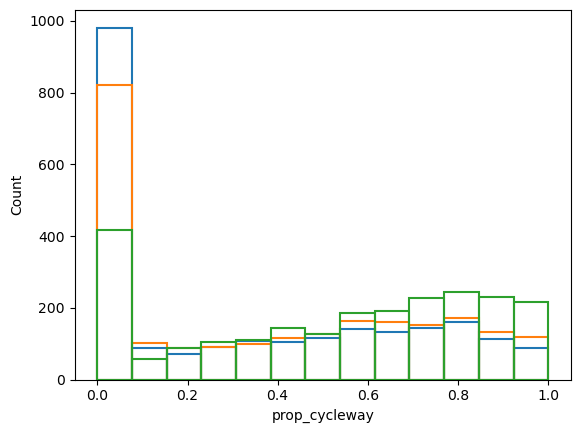

In [106]:
fig, ax = plt.subplots()

sns.histplot(n.evol[0],x = 'prop_cycleway',fill = False)
sns.histplot(n.evol[10],x = 'prop_cycleway',fill = False)

sns.histplot(n.evol[-1],x = 'prop_cycleway',fill = False)


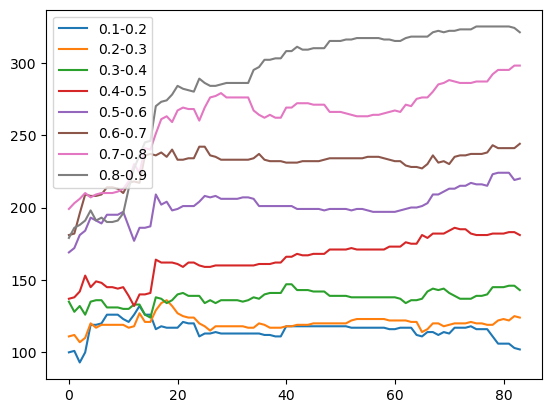

In [121]:
plt.figure()
for p in np.arange(0.1,0.9,0.1):
    plt.plot([len(e[(p<=e.prop_cycleway) & (e.prop_cycleway<p+0.1)]) for e in n.evol],label = f'{round(p,2)}-{round(p+0.1,2)}')

plt.legend()